<a href="https://colab.research.google.com/github/Himagination/GANs/blob/main/WGAN_Handwritten_Digits.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Objective

- Build a Wasserstein Generative Adversial Networks with Gradient Penalty(WGAN-GP)
- WGAN-GP does not use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

## Import required packages

In [1]:
import torch
import torch.nn as nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

## Utility function

In [2]:
def show_tensor_images(image_tensor, 
                       num_images=25, 
                       size=(1,28,28)):
  image_tensor = (image_tensor + 1) / 2
  image_unflat = image_tensor.detach().cpu()
  image_grid = make_grid(image_unflat[:num_images], nrow=5)
  plt.imshow(image_grid.permute(1, 2, 0).squeeze())
  plt.show()

In [3]:
def make_grad_hook():
  grads = []
  def grad_hook(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
      grads.append(m.weight.grad)
  return grads, grad_hook

In [4]:
class Generator(nn.Module):
  def __init__(self, 
               z_dim=10, 
               im_chan=1, 
               hidden_dim=64):
    super(Generator, self).__init__()
    self.z_dim = z_dim
    self.gen = nn.Sequential(
        self.make_gen_block(z_dim, hidden_dim * 4), 
        self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1), 
        self.make_gen_block(hidden_dim * 2, hidden_dim), 
        self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True)
    )

  def make_gen_block(self, 
                     input_channels, 
                     output_channels, 
                     kernel_size=3, 
                     stride=2, 
                     final_layer=False):
    if not final_layer:
      return nn.Sequential(
          nn.ConvTranspose2d(input_channels, 
                             output_channels, 
                             kernel_size, 
                             stride), 
          nn.BatchNorm2d(output_channels), 
          nn.ReLU(inplace=True), 
      )
    else:
      return nn.Sequential(
          nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride), 
          nn.Tanh()
      )

  def forward(self, noise):
    x = noise.view(len(noise), self.z_dim, 1, 1)
    return self.gen(x)

def get_noise(n_samples, z_dim, device="cpu"):
  return torch.randn(n_samples, z_dim).to(device)

In [5]:
class Critic(nn.Module):
  def __init__(self, im_chan=1, hidden_dim=64):
    super(Critic, self).__init__()
    self.critic = nn.Sequential(
        self.make_critic_block(im_chan, hidden_dim), 
        self.make_critic_block(hidden_dim, hidden_dim * 2), 
        self.make_critic_block(hidden_dim * 2, 1, final_layer=True)
    )

  def make_critic_block(self, 
                        input_channels, 
                        output_channels, 
                        kernel_size=4, 
                        stride=2,
                        final_layer=False):
    if not final_layer:
      return nn.Sequential(
          nn.Conv2d(input_channels, output_channels, kernel_size, stride), 
          nn.BatchNorm2d(output_channels), 
          nn.LeakyReLU(0.2, inplace=True)
      )
    else: 
      return nn.Sequential(
          nn.Conv2d(input_channels, output_channels, kernel_size, stride)
      )

  def forward(self, image):
    crit_pred = self.critic(image)
    return crit_pred.view(len(crit_pred), -1)

## Training Initializations

- **Parameters**
  - n_epochs
  - z_dim: The dimension of the noise vector
  - display_step: How often to display/visualize the images
  - batch_size: The number of images per forward/backward loss
  - lr: learning rate
  - beta_1, beta_2: The momentum terms
  - c_lambda: weight of the gradient penalty
  - crit_repeats: number of times to update the critic per generator update
  - device

In [6]:
# Parameters
n_epochs = 10
z_dim = 64
display_step = 50
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [7]:
# Load and Transform MNIST dataset
transform = transforms.Compose([
                                transforms.ToTensor(), 
                                transforms.Normalize((0.5, ), (0.5, ))
])

dataloader = DataLoader(
    MNIST('.', download=True, transform=transform), 
    batch_size=batch_size, 
    shuffle=True
)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [8]:
# Initialization
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), 
                           lr=lr, 
                           betas=(beta_1, beta_2))
crit = Critic().to(device)
crit_opt = torch.optim.Adam(crit.parameters(), 
                            lr=lr, 
                            betas=(beta_1, beta_2))

def weights_init(m):
  if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
    torch.nn.init.normal_(m.weight, 0.0, 0.02)
    torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)

## Gradient Penalty

Gradient Penalty can be broken into two functions:

- Compute the gradient with respect to the images
  - The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together.
  - Once there is an imtermediate image, get critic's output on the image.
  - Finally, compute the gradient of the critic score's on the mixed images(output) with respect to the pixels of the mixed images(input)
- Compute the gradient penalty given by the gradient
  - Calculate the magnitude of each image's gradient.(norm)
  - Calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all squared distances.

In [9]:
def get_gradient(crit, real, fake, epsilon):
  # Mix the images together
  mixed_images = real * epsilon + fake * (1 - epsilon)
  # Calculate the critic's scores on the mixed images
  mixed_scores = crit(mixed_images)
  # Take the gradient of the scores with respect to the images
  gradient = torch.autograd.grad(
      inputs=mixed_images, 
      outputs=mixed_scores, 
      grad_outputs=torch.ones_like(mixed_scores), 
      create_graph=True, 
      retain_graph=True
  )[0]
  return gradient

In [10]:
def gradient_penalty(gradient):
  # Flatten the gradients so that each row captures one image
  gradient = gradient.view(len(gradient), -1)
  # Calculate the magnitude of every row
  gradient_norm = gradient.norm(2, dim=1)
  # Penalize the mean squared distance of the gradient norms from 1
  penalty = torch.mean((gradient_norm - 1)**2)
  return penalty

## Losses

- For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images.
- For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch.


In [11]:
def get_gen_loss(crit_fake_pred):
  gen_loss = -1. * torch.mean(crit_fake_pred)
  return gen_loss

In [12]:
def get_crit_loss(crit_fake_pred, 
                  crit_real_pred, 
                  gp, 
                  c_lambda):
  crit_loss =  torch.mean(crit_fake_pred) - torch.mean(crit_real_pred) + c_lambda*gp
  return crit_loss

## Training

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50: Generator loss: 5.4770614886283875, critic loss: -13.4753375544548


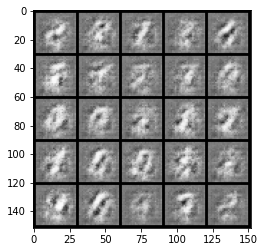

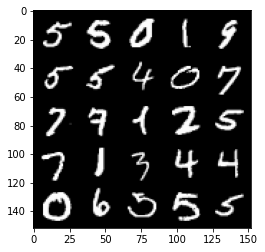

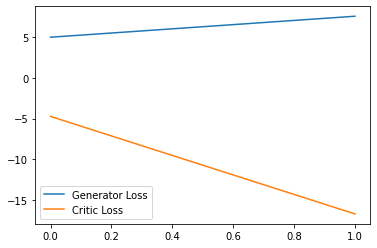

Step 100: Generator loss: -0.6073292544856668, critic loss: -33.454777076721186


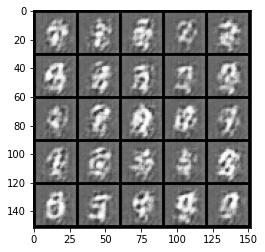

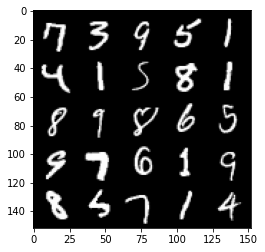

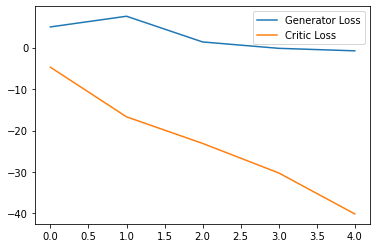

Step 150: Generator loss: 3.336931301951408, critic loss: -56.57057708740234


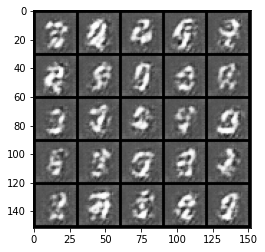

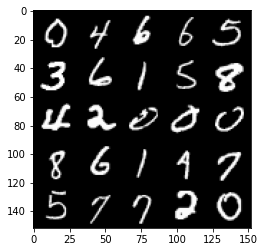

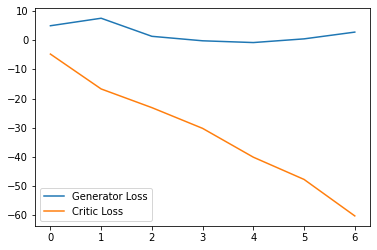

Step 200: Generator loss: -2.25489287853241, critic loss: -62.05656781005859


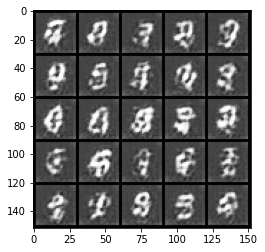

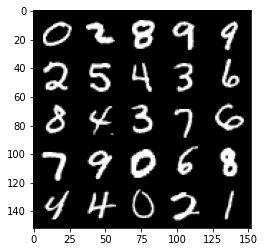

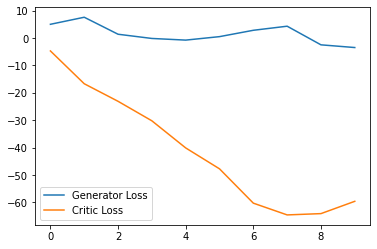

Step 250: Generator loss: -7.436142838001251, critic loss: -51.401045976638805


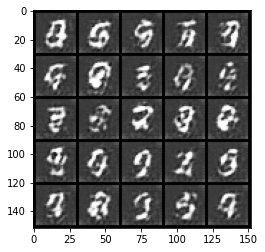

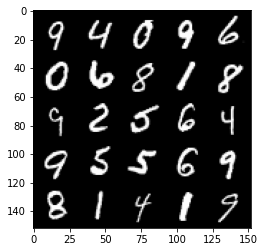

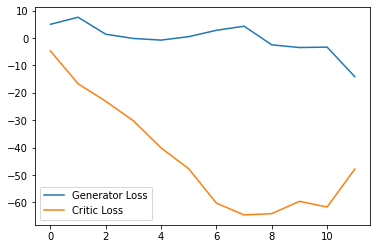

Step 300: Generator loss: 0.7950392401218415, critic loss: -35.18689052772521


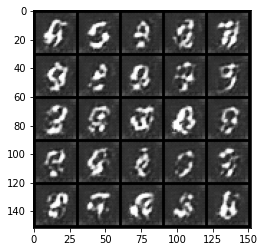

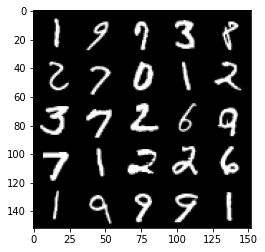

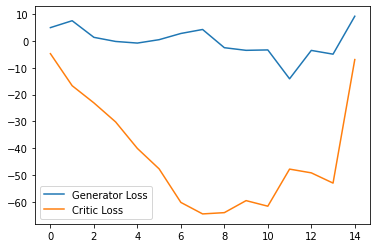

Step 350: Generator loss: 0.9810870018601417, critic loss: -29.509815603256225


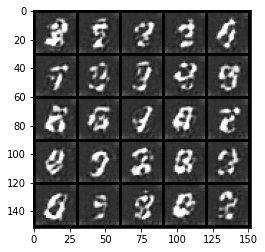

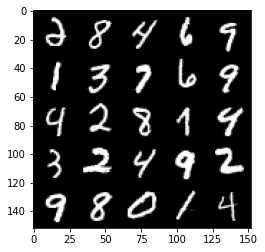

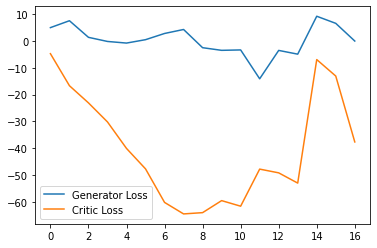

Step 400: Generator loss: -10.991310837864877, critic loss: -45.35258238983154


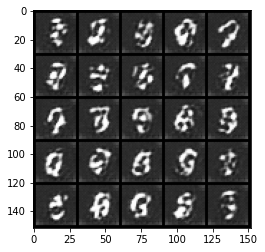

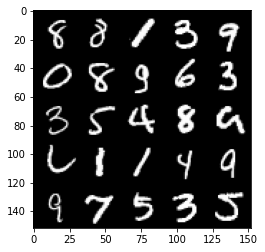

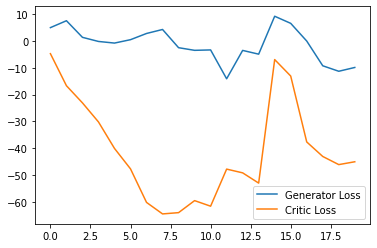

Step 450: Generator loss: -9.777069729566573, critic loss: -39.64802450942994


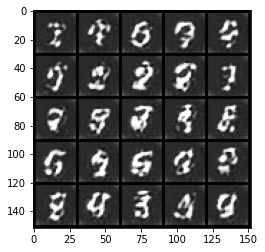

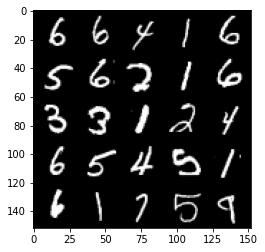

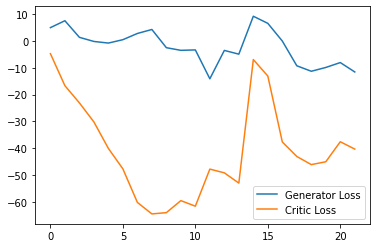

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: -0.790857681632042, critic loss: -25.26792090797424


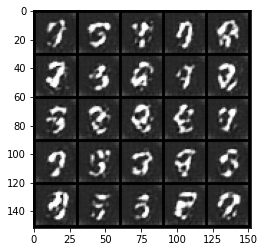

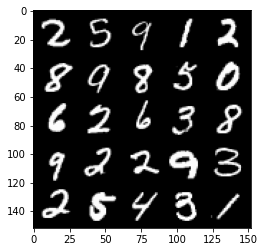

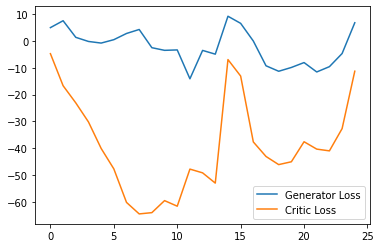

Step 550: Generator loss: 2.9399700778722764, critic loss: -21.86939130210877


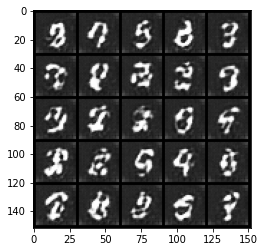

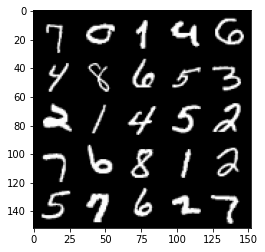

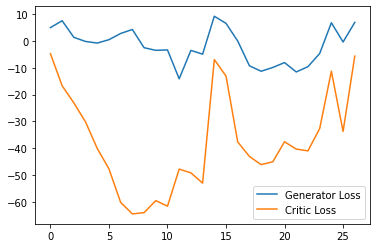

Step 600: Generator loss: -0.2928765296936035, critic loss: -33.551164161682124


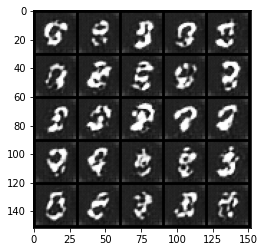

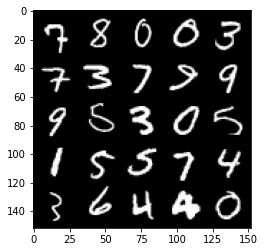

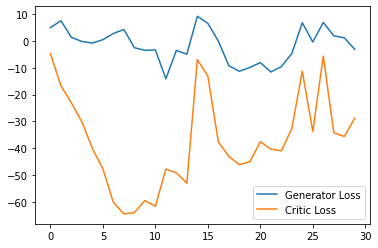

Step 650: Generator loss: -4.964216054081917, critic loss: -29.9254427947998


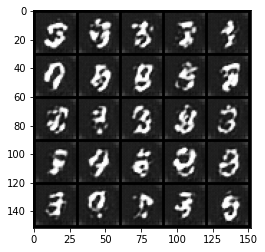

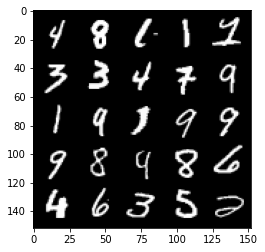

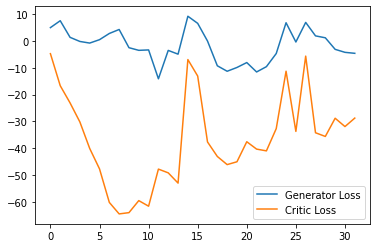

Step 700: Generator loss: 9.722536548376084, critic loss: -9.132410247802733


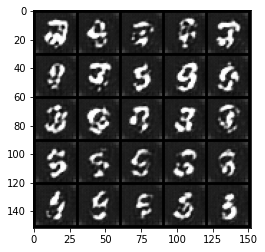

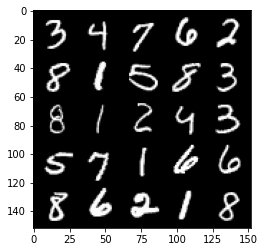

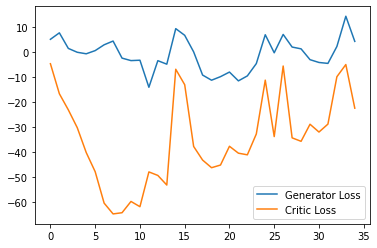

Step 750: Generator loss: 1.6549361145496368, critic loss: -26.391074600219728


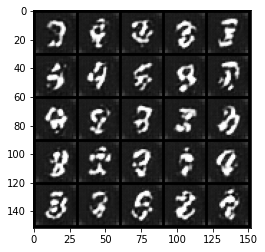

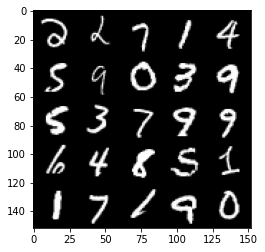

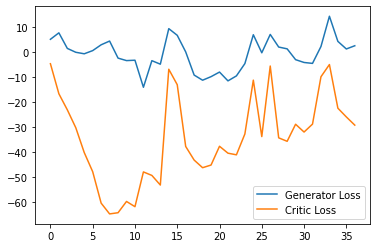

Step 800: Generator loss: 4.237137415409088, critic loss: -22.953057886123656


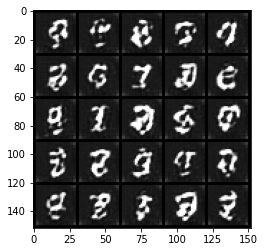

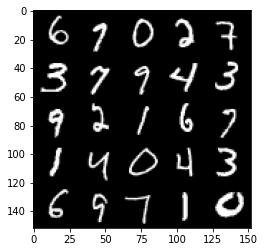

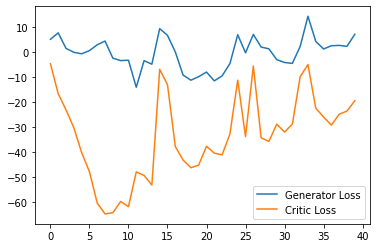

Step 850: Generator loss: 5.739133458435536, critic loss: -21.051838897705082


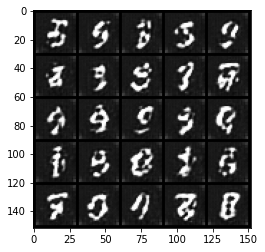

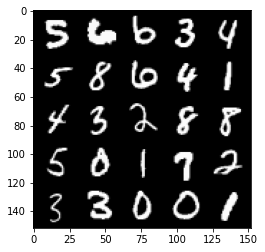

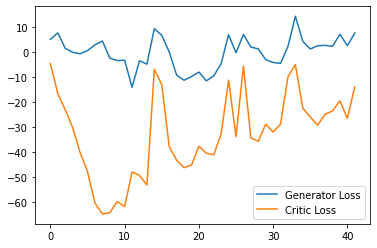

Step 900: Generator loss: 4.5001673567295075, critic loss: -19.653630687713623


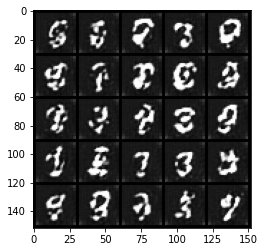

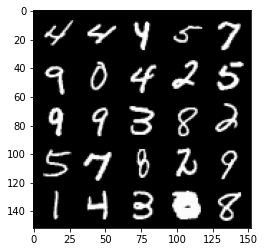

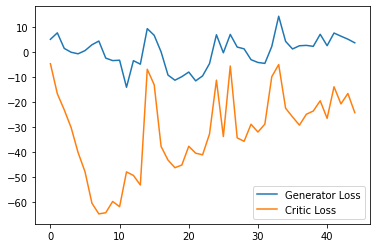

  0%|          | 0/469 [00:00<?, ?it/s]

Step 950: Generator loss: 7.149108731150627, critic loss: -20.43849019432068


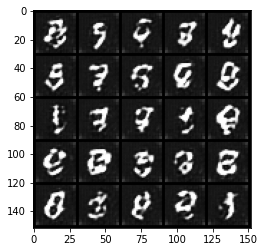

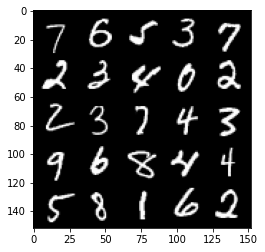

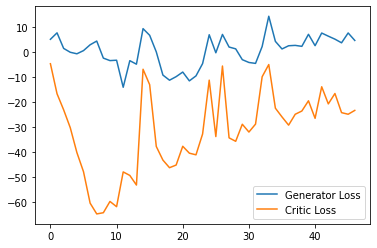

Step 1000: Generator loss: 9.420864365696907, critic loss: -16.9025666809082


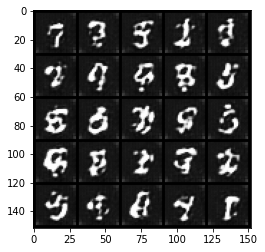

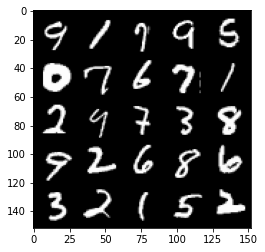

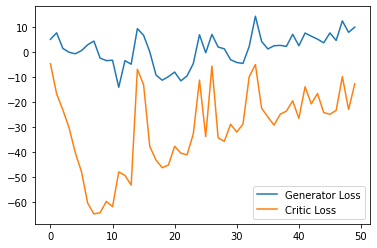

Step 1050: Generator loss: 5.6949993172287945, critic loss: -19.889892169952397


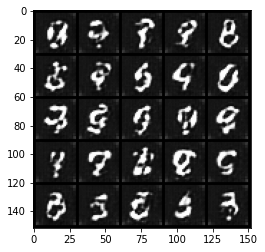

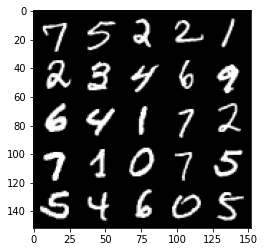

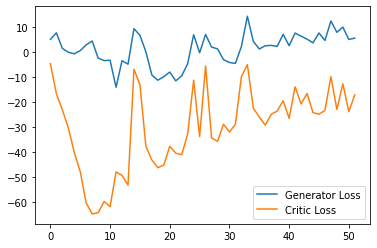

Step 1100: Generator loss: 13.22289520740509, critic loss: -6.223618990421295


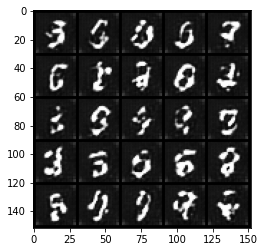

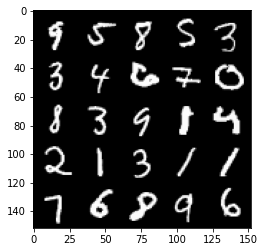

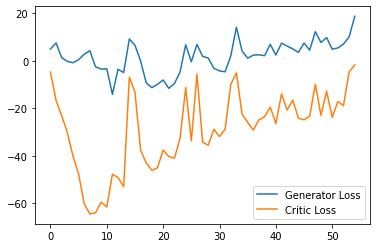

Step 1150: Generator loss: 17.92750213623047, critic loss: -2.6502260427474975


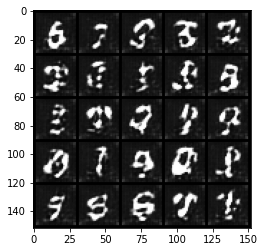

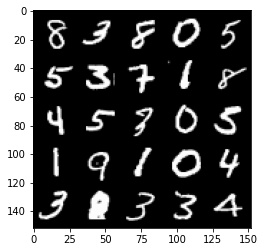

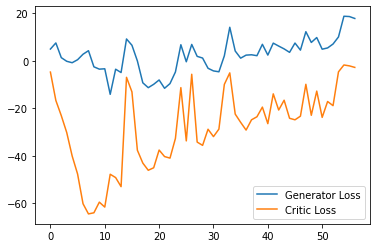

Step 1200: Generator loss: 13.263255805969239, critic loss: -8.730321715354922


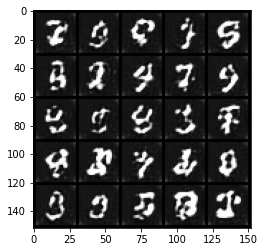

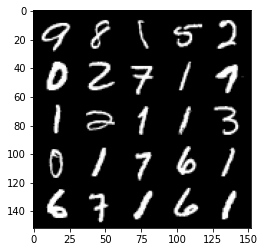

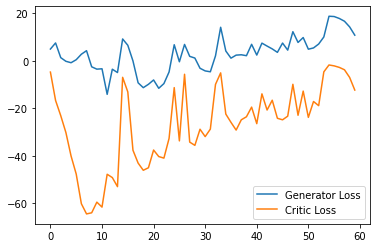

Step 1250: Generator loss: 9.368495707511903, critic loss: -16.101256471633913


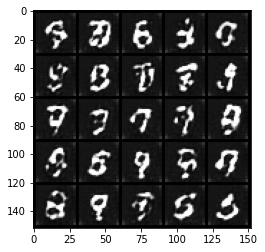

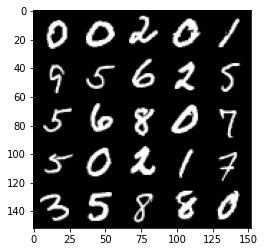

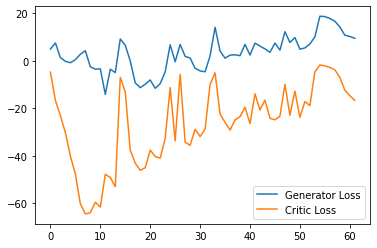

Step 1300: Generator loss: 11.843717578649521, critic loss: -9.259461642742156


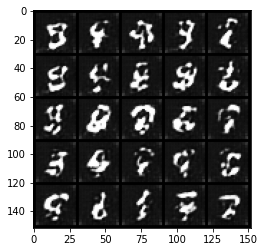

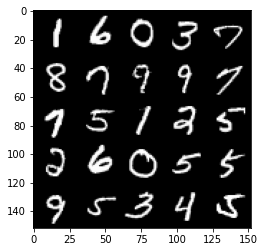

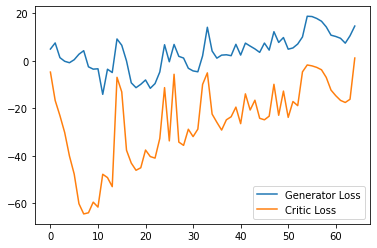

Step 1350: Generator loss: 15.408274402618408, critic loss: -6.088064368247985


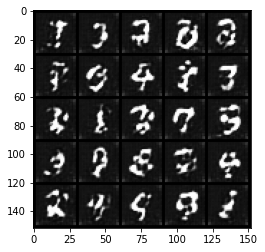

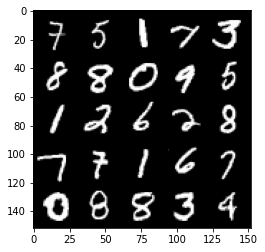

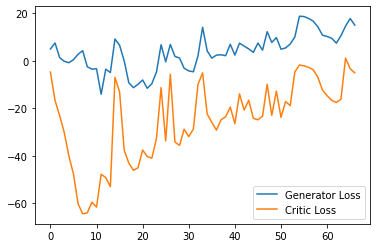

Step 1400: Generator loss: 9.521221685409547, critic loss: -14.687978816032405


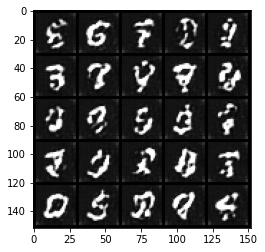

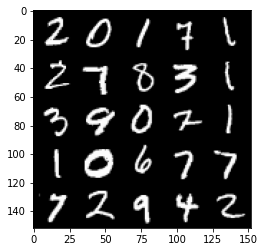

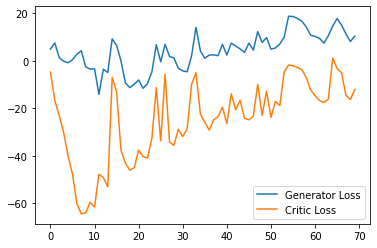

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1450: Generator loss: 10.268595118522644, critic loss: -16.096534727096554


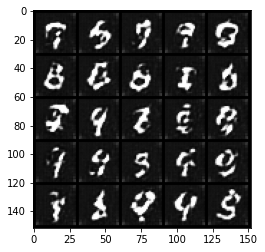

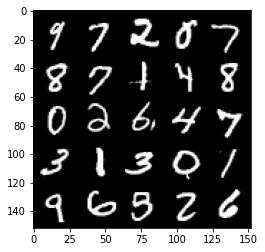

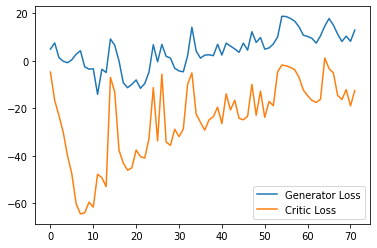

Step 1500: Generator loss: 10.836065464019775, critic loss: -14.433199676513675


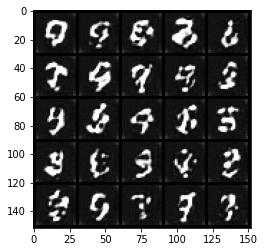

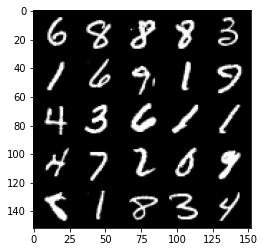

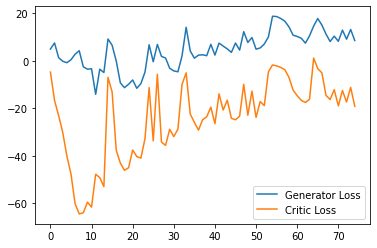

Step 1550: Generator loss: 13.783189659118653, critic loss: -11.2951597661972


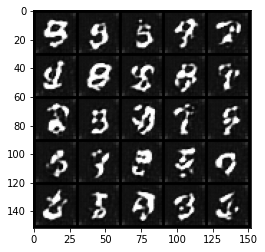

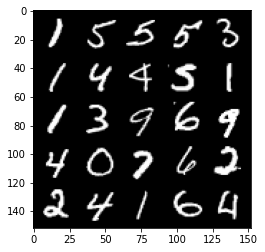

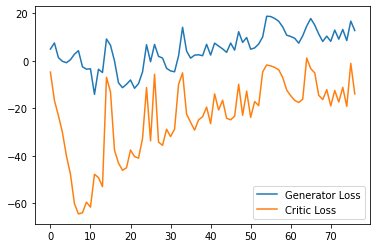

Step 1600: Generator loss: 13.846849932670594, critic loss: -9.35316578197479


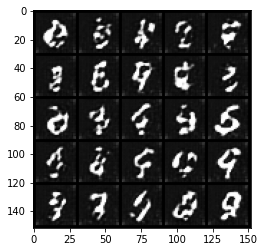

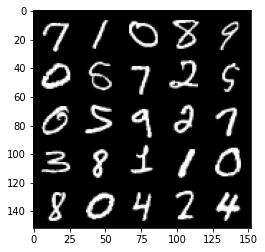

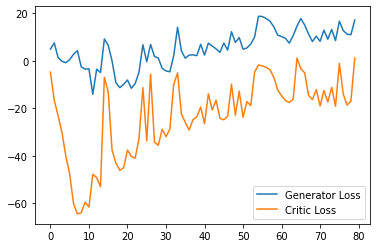

Step 1650: Generator loss: 17.70608451843262, critic loss: -3.374970734596253


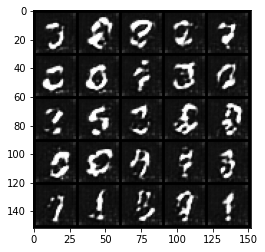

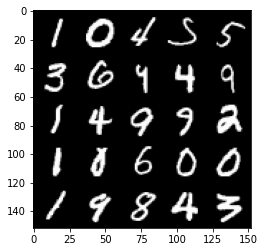

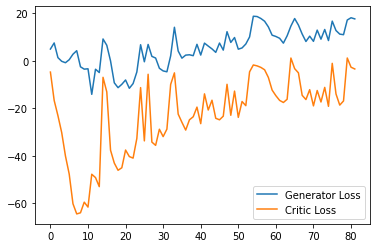

Step 1700: Generator loss: 11.156287126541137, critic loss: -13.8891352481842


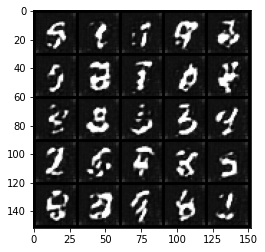

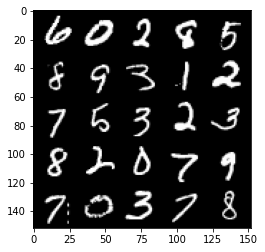

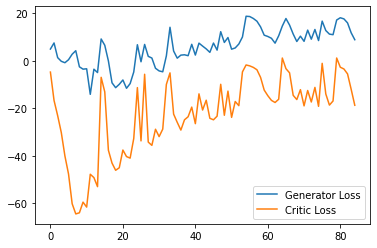

Step 1750: Generator loss: 11.01355237007141, critic loss: -11.222649590969084


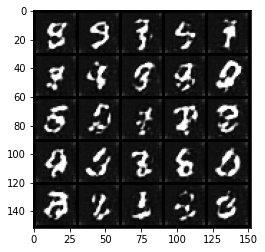

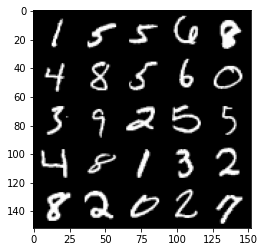

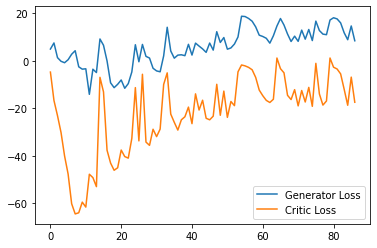

Step 1800: Generator loss: 14.546684265136719, critic loss: -12.21157887363434


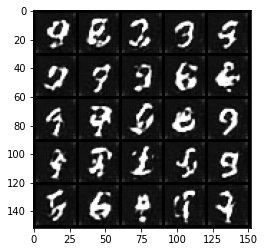

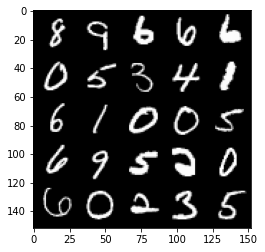

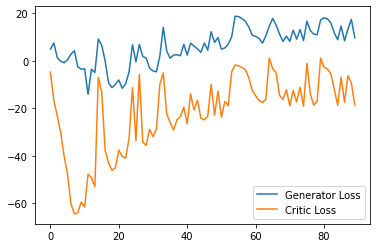

Step 1850: Generator loss: 12.452429877519608, critic loss: -13.913367993354793


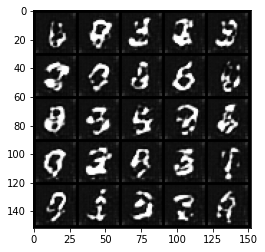

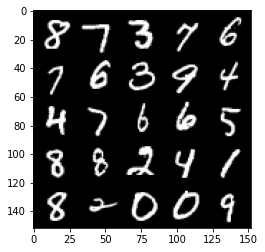

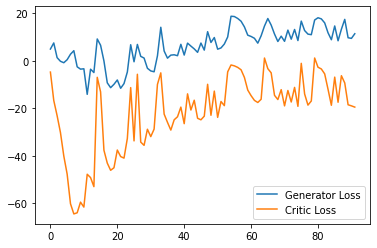

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1900: Generator loss: 16.073575077056883, critic loss: -9.878519875526429


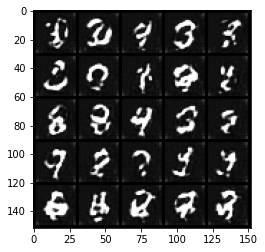

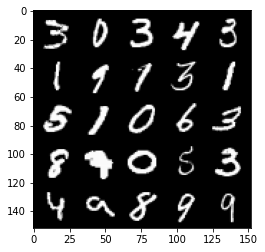

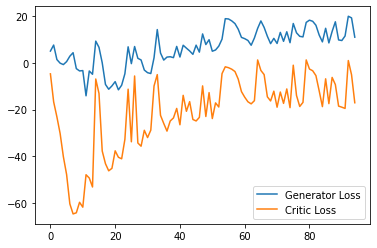

Step 1950: Generator loss: 14.776800968647002, critic loss: -6.434571238040925


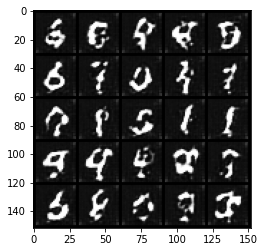

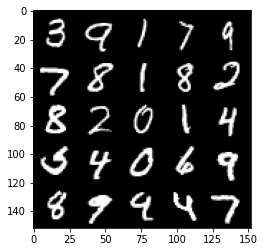

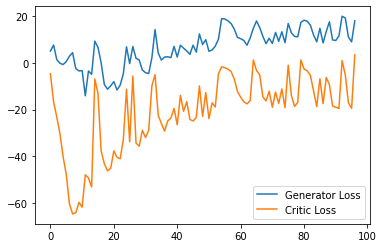

Step 2000: Generator loss: 19.398229026794432, critic loss: -1.8486769881248468


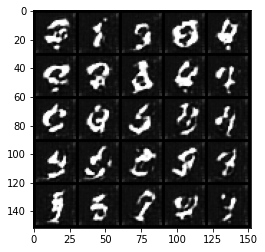

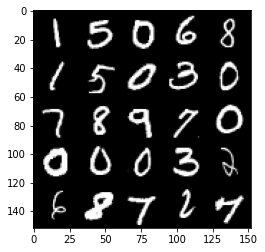

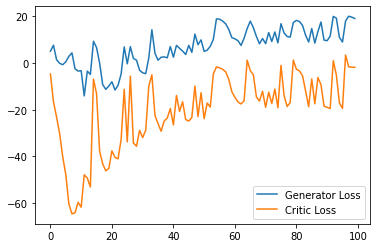

Step 2050: Generator loss: 17.94999282836914, critic loss: -2.3389161229133597


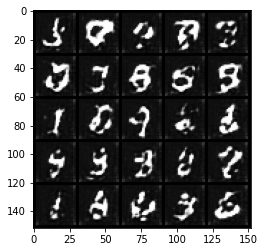

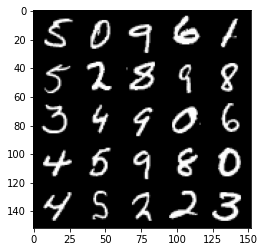

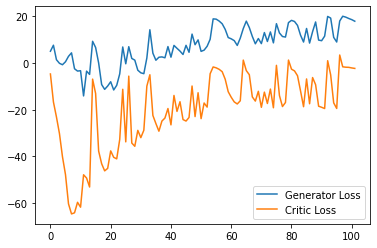

Step 2100: Generator loss: 16.55941120147705, critic loss: -3.5520457973480233


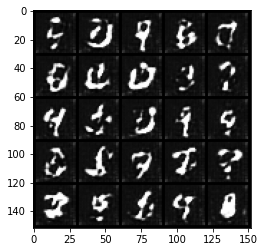

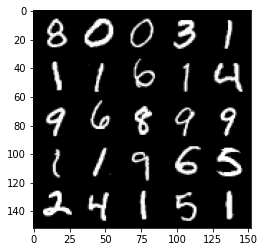

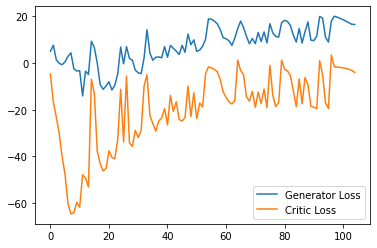

Step 2150: Generator loss: 12.35080651283264, critic loss: -10.142745438575744


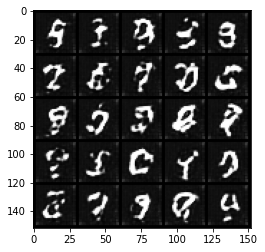

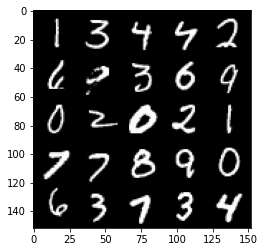

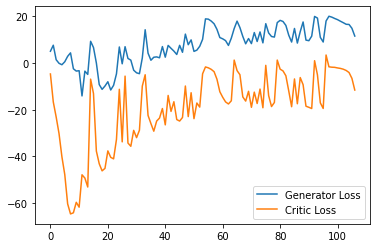

Step 2200: Generator loss: 12.7343740940094, critic loss: -7.772468530178072


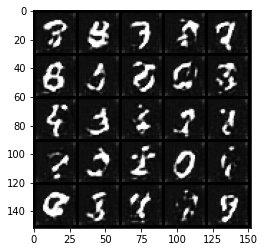

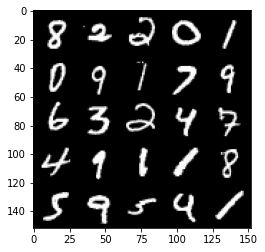

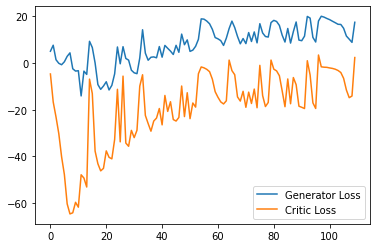

Step 2250: Generator loss: 17.69879898071289, critic loss: -3.535957193851471


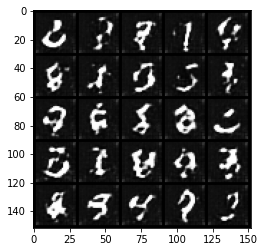

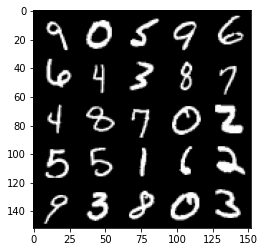

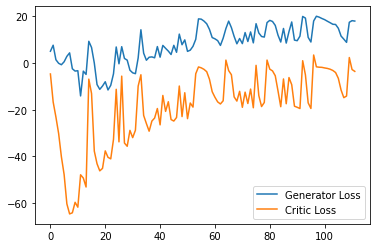

Step 2300: Generator loss: 11.763193454742431, critic loss: -12.511997228622436


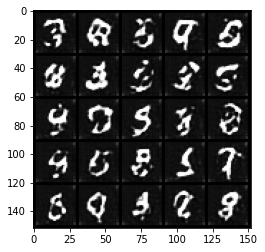

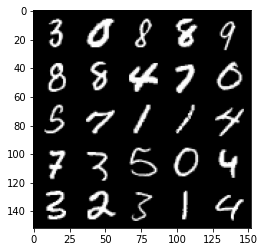

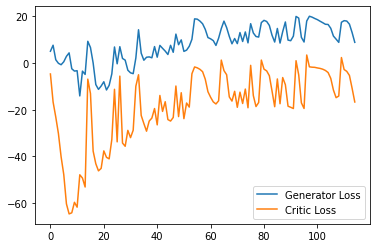

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2350: Generator loss: 11.543985986709595, critic loss: -10.333641880512241


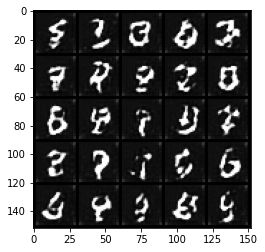

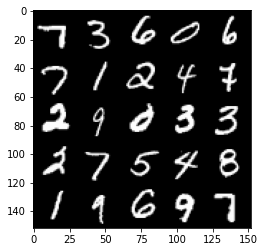

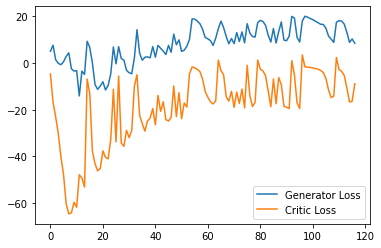

Step 2400: Generator loss: 18.723378410339354, critic loss: -3.9979909696579


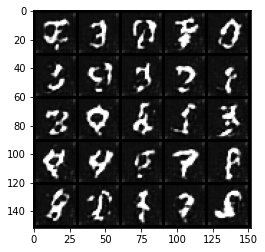

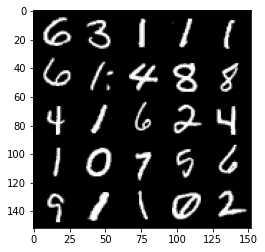

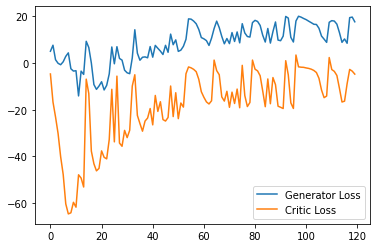

Step 2450: Generator loss: 11.893606691360473, critic loss: -12.284991226196286


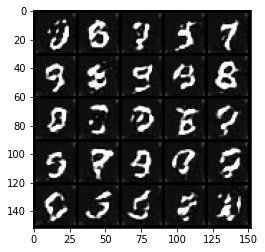

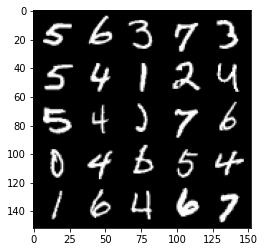

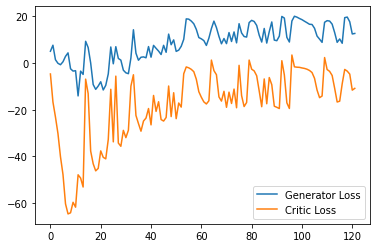

Step 2500: Generator loss: 10.95129937171936, critic loss: -16.00516565418243


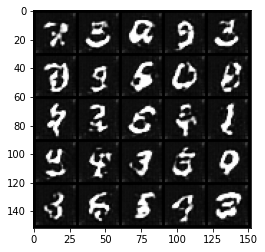

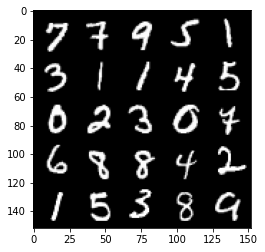

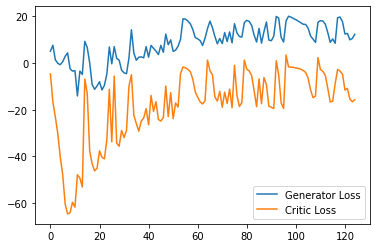

Step 2550: Generator loss: 15.185647304058074, critic loss: -11.7706129989624


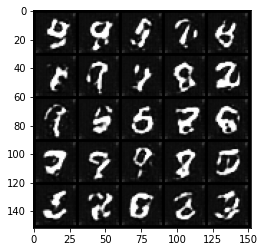

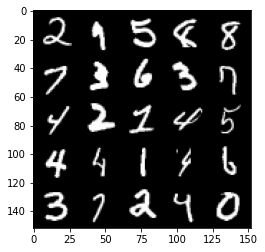

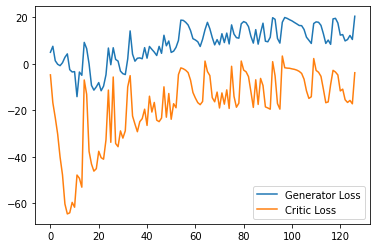

Step 2600: Generator loss: 12.2463205909729, critic loss: -16.87995183134079


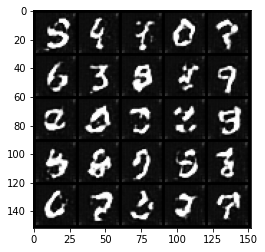

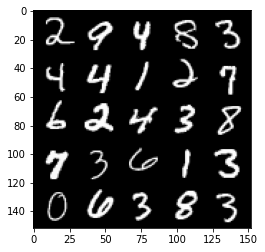

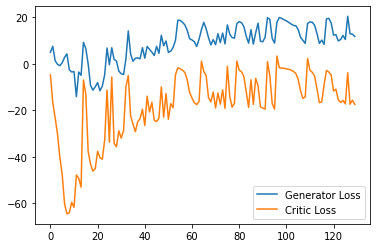

Step 2650: Generator loss: 21.569398441314696, critic loss: -0.8202862734794618


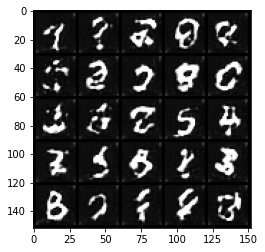

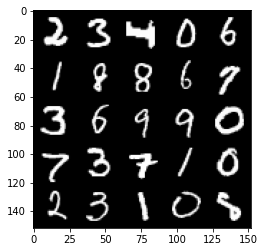

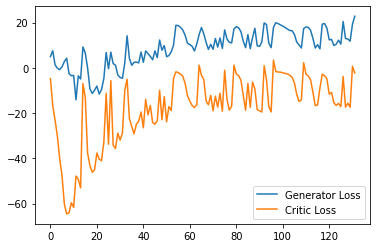

Step 2700: Generator loss: 20.900500831604003, critic loss: -3.680513333320617


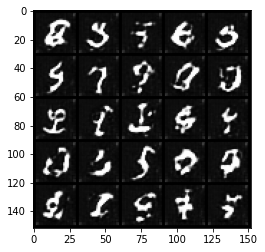

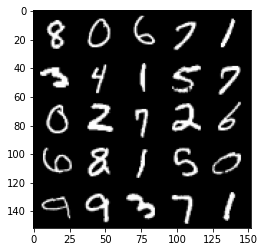

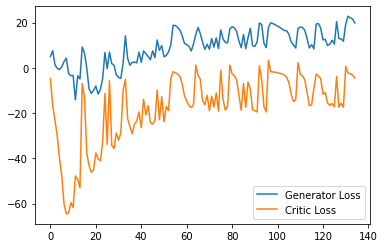

Step 2750: Generator loss: 16.066514434814454, critic loss: -11.92521226787567


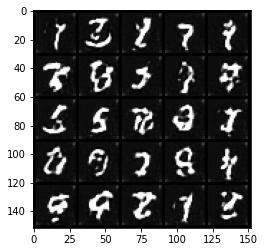

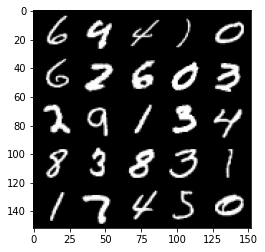

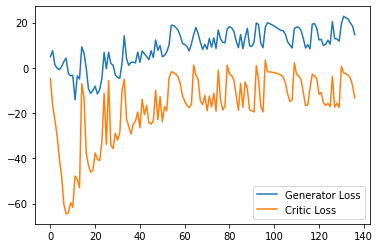

Step 2800: Generator loss: 15.543803615570068, critic loss: -13.067849750518798


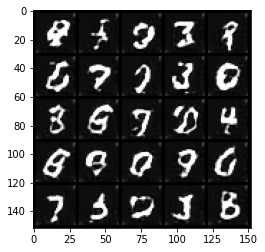

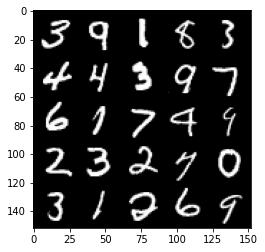

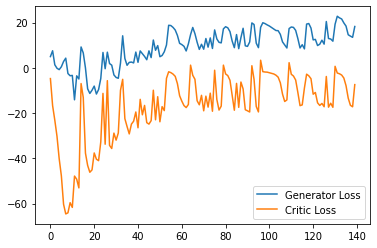

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2850: Generator loss: 20.915212531089782, critic loss: -6.862372336387633


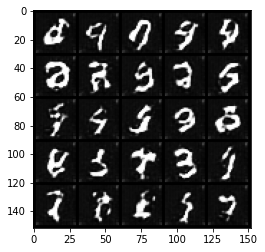

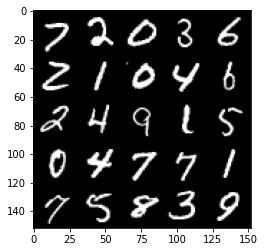

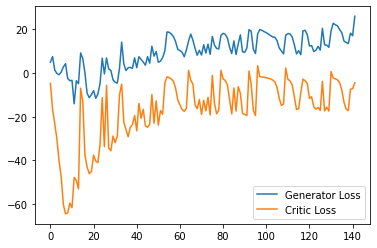

Step 2900: Generator loss: 15.426600646972656, critic loss: -17.774268865585327


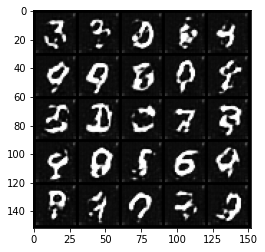

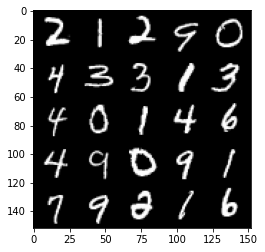

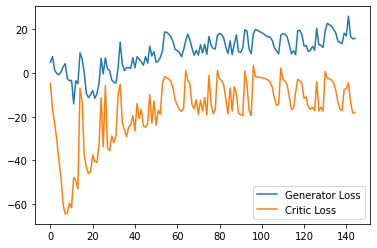

Step 2950: Generator loss: 19.731088333129883, critic loss: -8.5346099820137


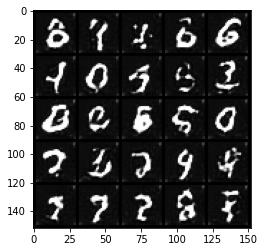

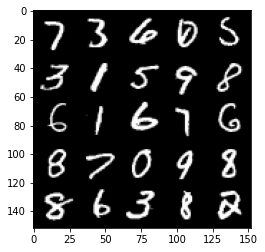

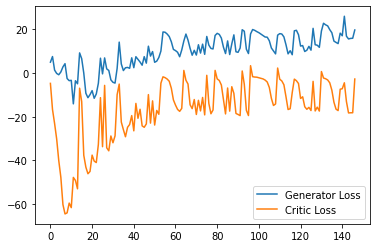

Step 3000: Generator loss: 24.2127445602417, critic loss: -2.3439215717315673


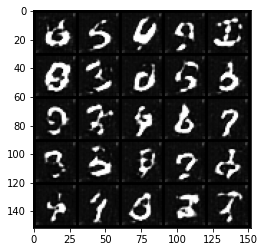

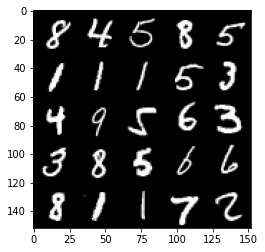

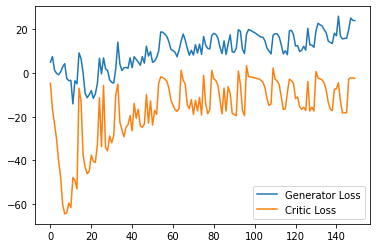

Step 3050: Generator loss: 23.175453300476075, critic loss: -2.8754884710311894


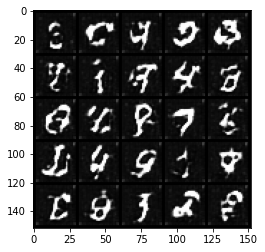

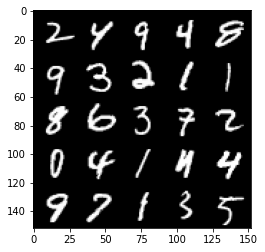

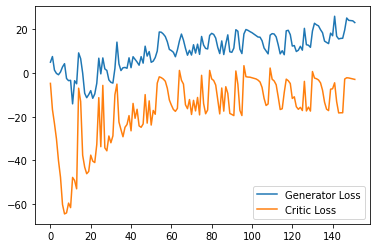

Step 3100: Generator loss: 20.805729637145998, critic loss: -4.758641017913816


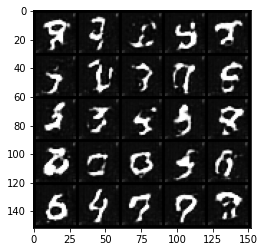

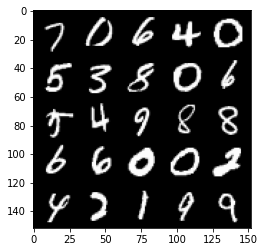

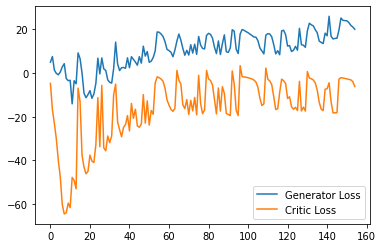

Step 3150: Generator loss: 17.646403484344482, critic loss: -11.091891388893128


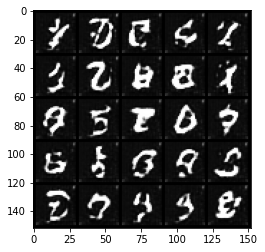

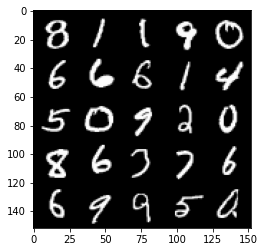

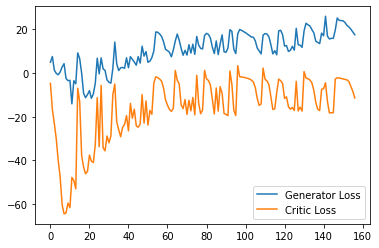

Step 3200: Generator loss: 21.318003587722778, critic loss: -6.514504403114317


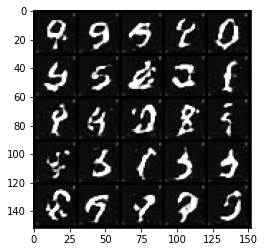

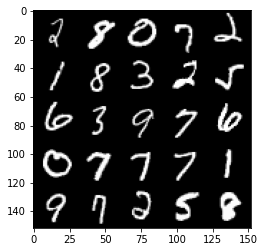

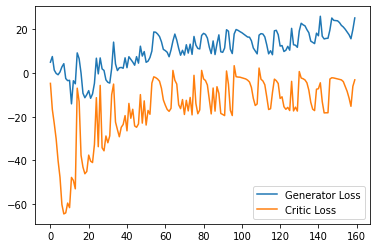

Step 3250: Generator loss: 19.58473617553711, critic loss: -11.10064466762543


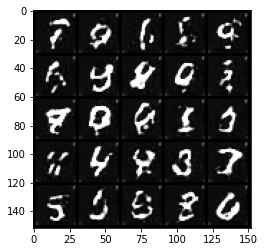

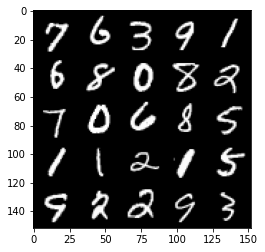

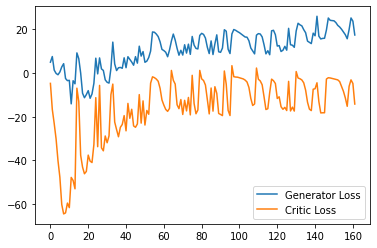

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3300: Generator loss: 20.640379390716554, critic loss: -5.945269510984417


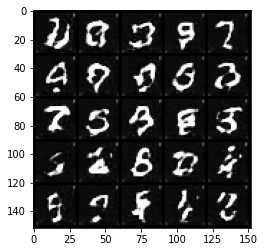

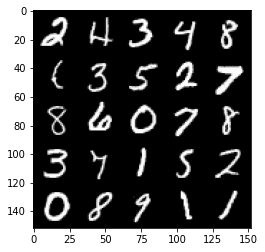

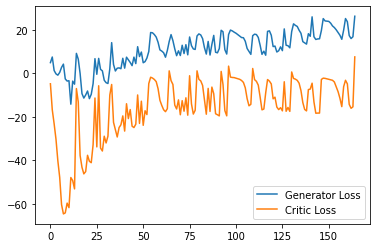

Step 3350: Generator loss: 24.991550750732422, critic loss: -1.9176250004768378


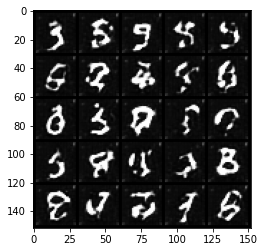

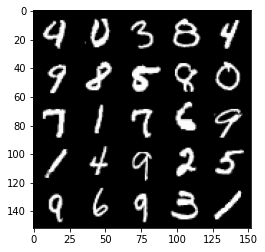

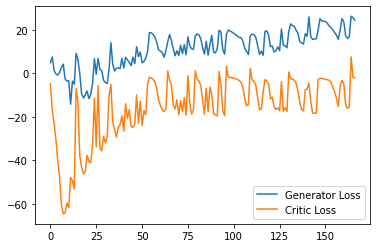

Step 3400: Generator loss: 23.82517028808594, critic loss: -2.4274686222076416


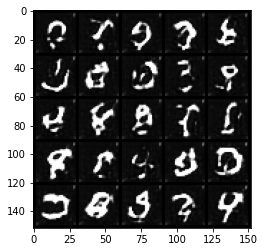

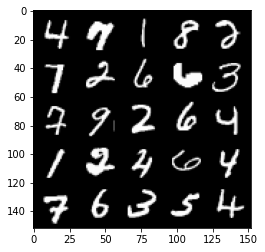

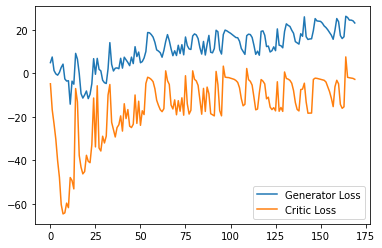

Step 3450: Generator loss: 21.89420539855957, critic loss: -4.894459050655366


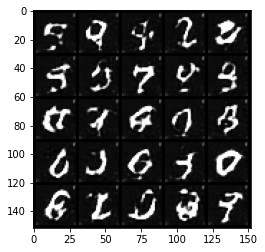

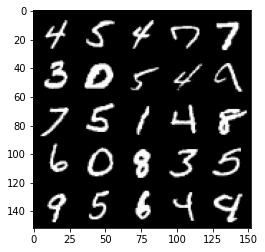

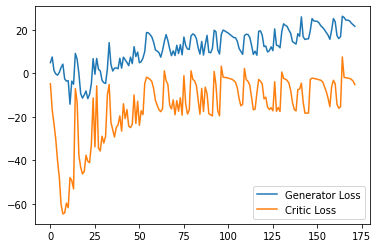

Step 3500: Generator loss: 18.529085597991944, critic loss: -11.111718256473539


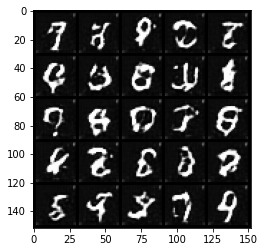

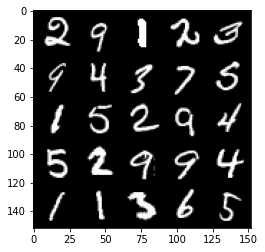

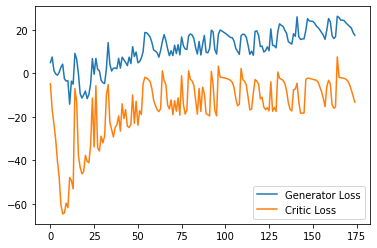

Step 3550: Generator loss: 23.91156620025635, critic loss: -1.6681438131332404


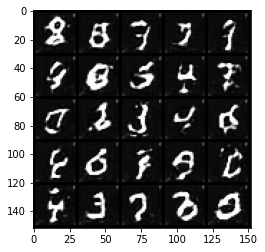

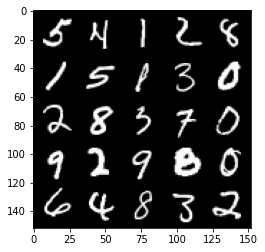

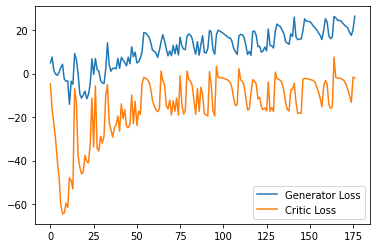

Step 3600: Generator loss: 24.703283309936523, critic loss: -2.3754611563682557


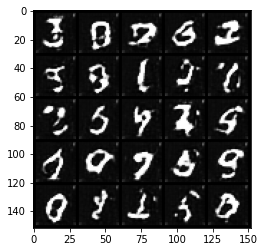

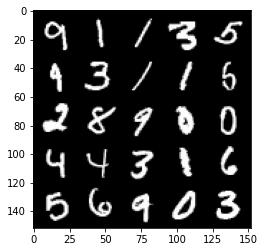

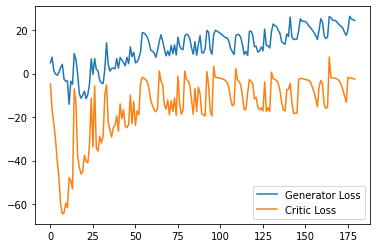

Step 3650: Generator loss: 23.330214500427246, critic loss: -4.369202308654785


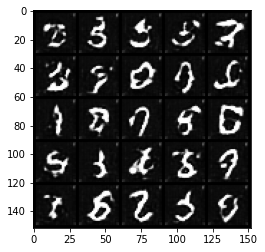

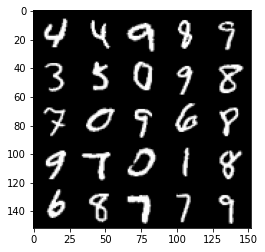

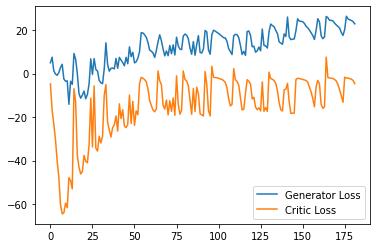

Step 3700: Generator loss: 20.484133014678957, critic loss: -9.50458510351181


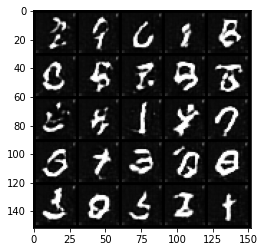

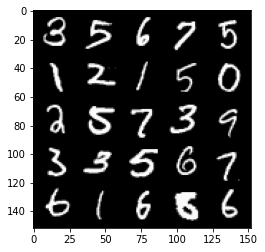

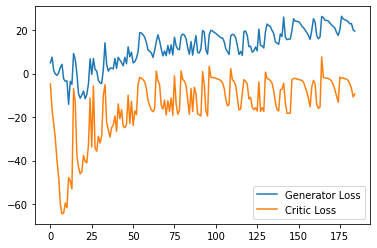

Step 3750: Generator loss: 21.014167098999025, critic loss: -10.30040060567856


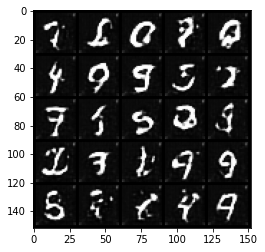

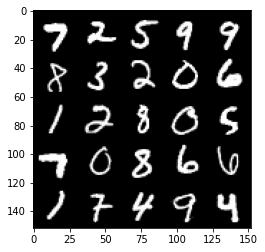

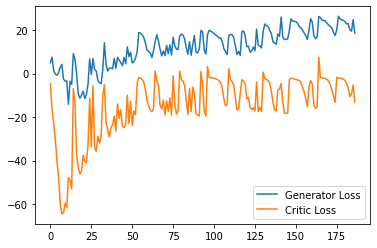

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3800: Generator loss: 20.584454154968263, critic loss: -14.674876072406768


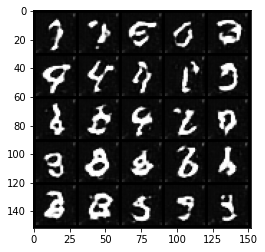

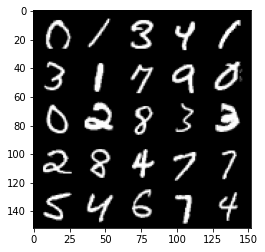

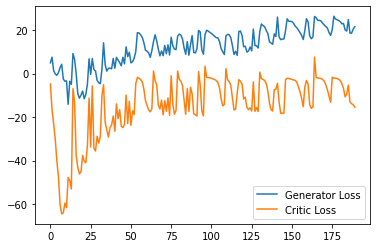

Step 3850: Generator loss: 20.52162187576294, critic loss: -13.65512307548523


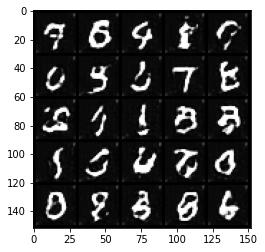

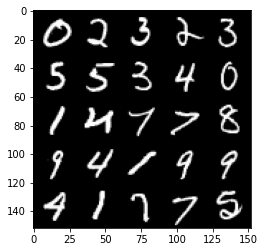

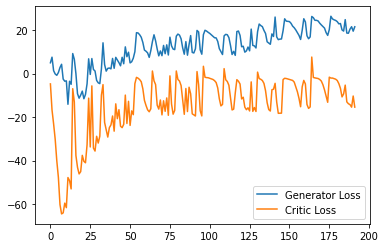

Step 3900: Generator loss: 22.17547439575195, critic loss: -14.986547664642329


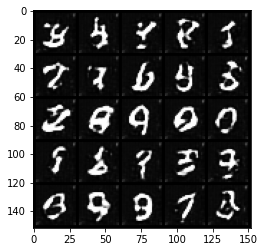

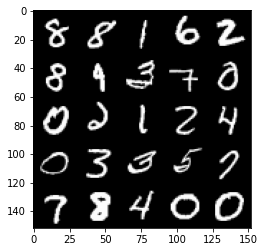

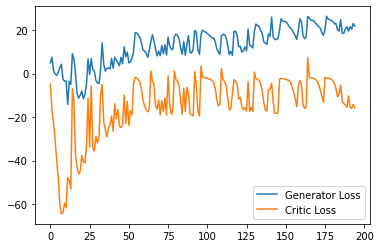

Step 3950: Generator loss: 27.957194023132324, critic loss: -6.092376436233521


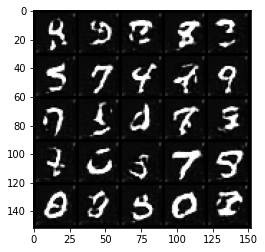

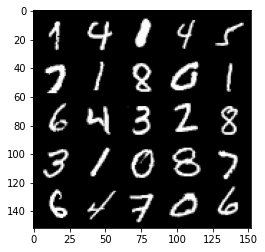

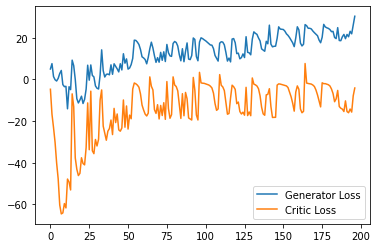

Step 4000: Generator loss: 24.215506024360657, critic loss: -7.509114966869355


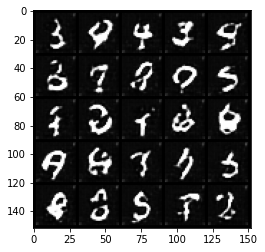

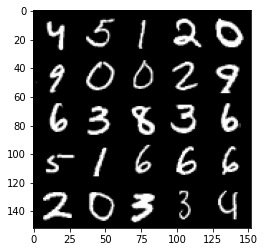

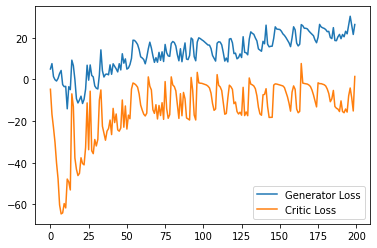

Step 4050: Generator loss: 29.340046768188476, critic loss: -2.0796351389884946


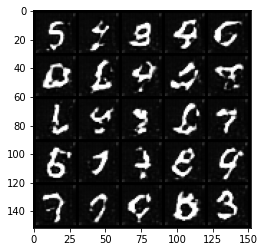

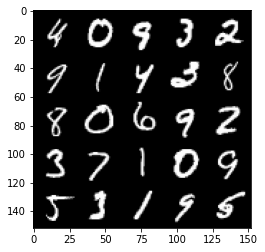

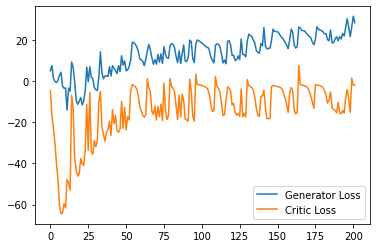

Step 4100: Generator loss: 27.11378444671631, critic loss: -3.4425790815353405


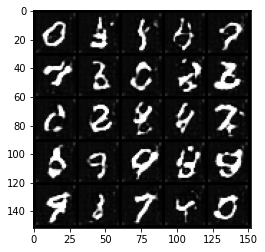

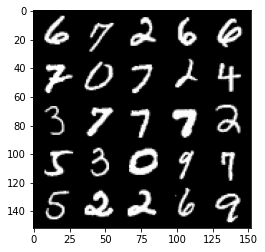

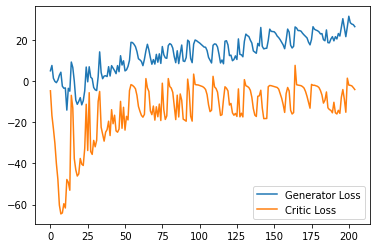

Step 4150: Generator loss: 24.26281894683838, critic loss: -7.671390634536745


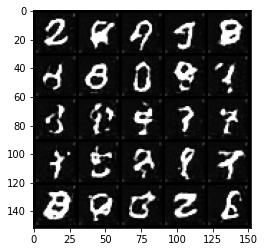

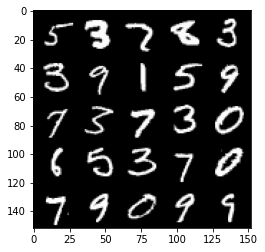

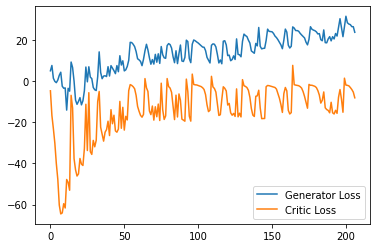

Step 4200: Generator loss: 25.01378074526787, critic loss: -7.145471714019776


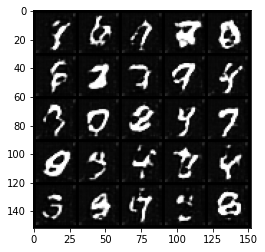

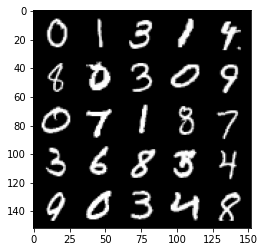

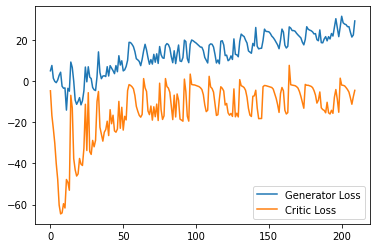

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4250: Generator loss: 22.25732633590698, critic loss: -13.343551854133604


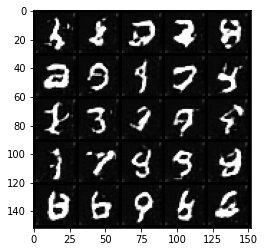

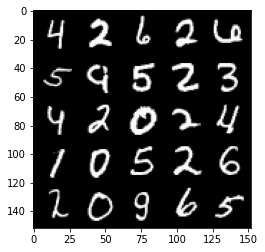

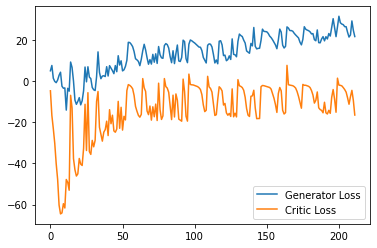

Step 4300: Generator loss: 22.41214553833008, critic loss: -15.76888046836853


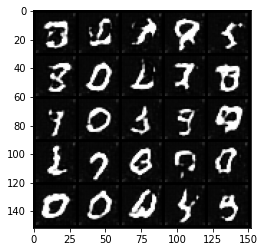

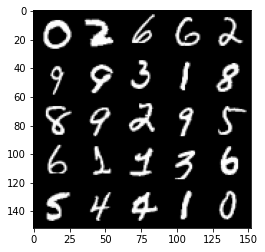

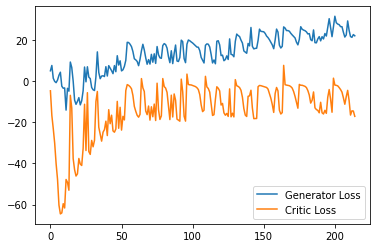

Step 4350: Generator loss: 27.8628489112854, critic loss: -7.167202098608018


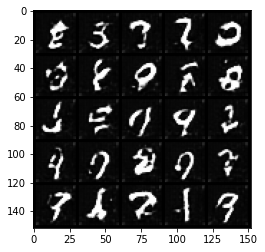

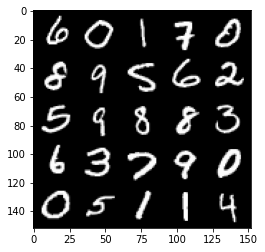

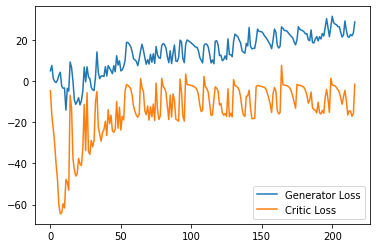

Step 4400: Generator loss: 31.65840091705322, critic loss: -2.7441615076065062


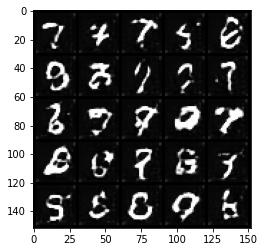

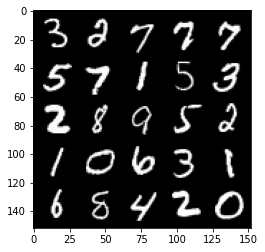

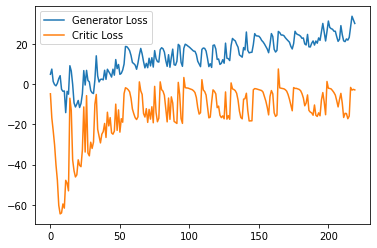

Step 4450: Generator loss: 28.04698497772217, critic loss: -5.6782720680236825


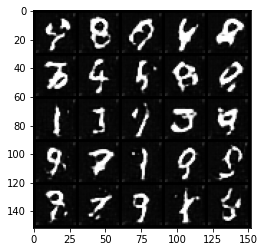

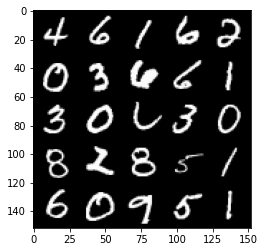

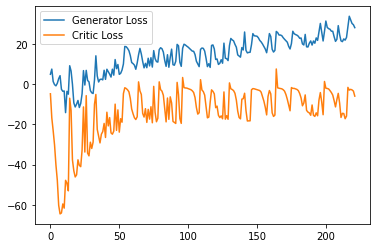

Step 4500: Generator loss: 22.635971069335938, critic loss: -15.071008221149446


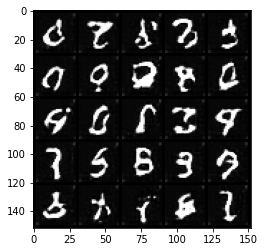

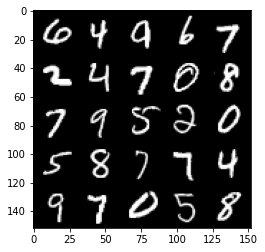

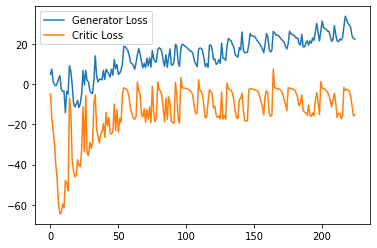

Step 4550: Generator loss: 23.401313858032225, critic loss: -12.877893354415898


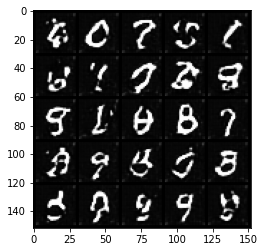

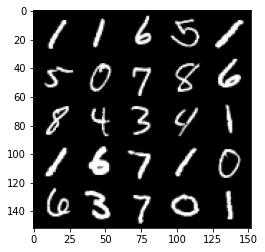

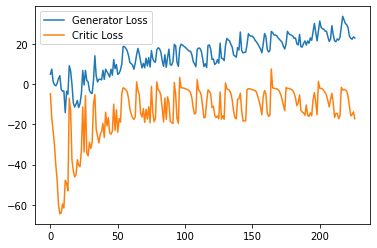

Step 4600: Generator loss: 29.397092475891114, critic loss: -7.002266338348388


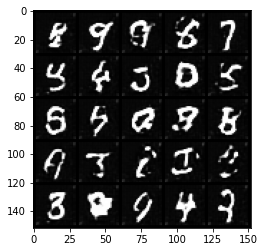

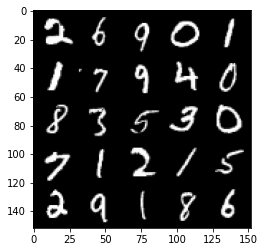

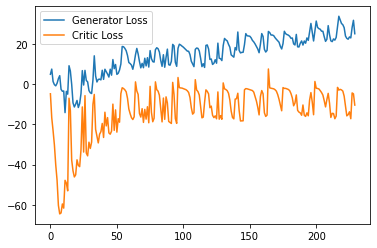

Step 4650: Generator loss: 27.105800819396972, critic loss: -10.551935225963591


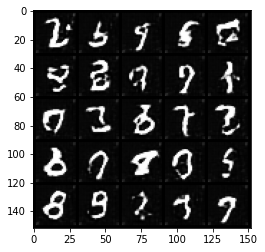

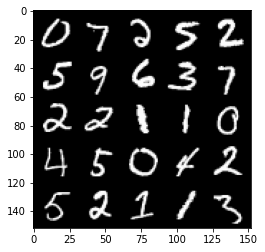

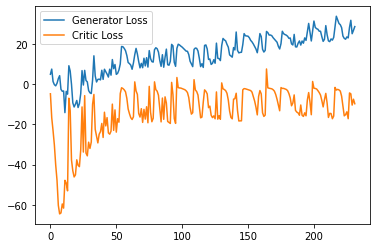

In [13]:
cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
  for real, _ in tqdm(dataloader):
    cur_batch_size = len(real)
    real = real.to(device)
    mean_iteration_critic_loss = 0
    for _ in range(crit_repeats):
      # Update critic
      crit_opt.zero_grad()
      fake_noise = get_noise(cur_batch_size, z_dim, device=device)
      fake = gen(fake_noise)
      crit_fake_pred = crit(fake.detach())
      crit_real_pred = crit(real)

      epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
      gradient = get_gradient(crit, real, fake.detach(), epsilon)
      gp = gradient_penalty(gradient)
      crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)
      # Keep track of the average critic loss in this batch
      mean_iteration_critic_loss += crit_loss.item() / crit_repeats
      # Update gradients
      crit_loss.backward(retain_graph=True)
      # Update optimizer
      crit_opt.step()
    critic_losses += [mean_iteration_critic_loss]

    # Update generator
    gen_opt.zero_grad()
    fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
    fake_2 = gen(fake_noise_2)
    crit_fake_pred = crit(fake_2)
    gen_loss = get_gen_loss(crit_fake_pred)
    gen_loss.backward()
    # Update the weights
    gen_opt.step()
    # Keep track of the average generator loss
    generator_losses += [gen_loss.item()]

    # Visualization
    if cur_step % display_step == 0 and cur_step > 0:
      gen_mean = sum(generator_losses[-display_step:]) / display_step
      crit_mean = sum(critic_losses[-display_step:]) / display_step
      print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
      show_tensor_images(fake)
      show_tensor_images(real)
      step_bins=20
      num_examples = (len(generator_losses) // step_bins) * step_bins
      plt.plot(
          range(num_examples // step_bins), 
          torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1), 
          label="Generator Loss"
      )
      plt.plot(
          range(num_examples // step_bins), 
          torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1), 
          label="Critic Loss"
      )
      plt.legend()
      plt.show()
    cur_step += 1
  

